# How to store/retrieve a `Detector` object

In this how-to guide we will see how to store an existing `Detector` object (e.g. a `CCD` detector) into a file (e.g. hdf5) and how to load a file into a new `Detector` object.

By the end of the lesson you will know how to:
* Save a `CCD` detector object into a HDF5 file with method `Detector.to_hdf5`
* Load a `CCD` detector object from a HDF5 file with method `Detector.from_hdf5`

To create the `CCD` detector object, we will run the simple pipeline from the [first simulation pipeline](https://gitlab.com/esa/pyxel-data/-/blob/master/tutorial/01_first_simulation.ipynb).

## Get a new CCD detector object

We are going to create a new CCD detector object based on our [first simulation pipeline](https://gitlab.com/esa/pyxel-data/-/blob/master/tutorial/01_first_simulation.ipynb).

### Run a simple pipeline

Run a simple pipeline to create a new `CCDDetector` object.

In [1]:
import pyxel

# Load the configuration file
config = pyxel.load("exposure.yaml")

# Run the pipeline
result = pyxel.exposure_mode(
    exposure=config.exposure,
    detector=config.ccd_detector,
    pipeline=config.pipeline,
)

result

Observation time:   0%|          | 0/3 [00:00<?, ?it/s]

<xarray.Dataset>
Dimensions:       (readout_time: 3, y: 450, x: 450)
Coordinates:
  * readout_time  (readout_time) float64 1.0 5.0 7.0
  * y             (y) int64 0 1 2 3 4 5 6 7 ... 442 443 444 445 446 447 448 449
  * x             (x) int64 0 1 2 3 4 5 6 7 ... 442 443 444 445 446 447 448 449
Data variables:
    image         (readout_time, y, x) uint32 9426 9025 8843 ... 20304 21011
    signal        (readout_time, y, x) float64 1.438 1.377 1.349 ... 3.098 3.206
    pixel         (readout_time, y, x) float64 1.438e+04 1.377e+04 ... 3.206e+04
Attributes:
    pyxel version:  1.5+158.g3bed0fd0.dirty
    running mode:   Exposure

In [2]:
# Get the detector object
detector = config.ccd_detector

detector

### Display detector

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
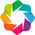

:Layout
   .DynamicMap.Array     :DynamicMap   [Array]
      :Image   [x,y]   (z)
   .DynamicMap.Histogram :DynamicMap   [Array]
      :Histogram   [z]   (z_count)

In [3]:
pyxel.display_detector(detector)

## Store 'detector' into a HDF5 file

In [4]:
def get_file_size(filename):
    """Display filename's size."""
    import os

    size = os.path.getsize(filename) / 1024 / 1024
    print(f"Size of file {filename!r}: {size:.2f} MB")

In [5]:
detector.to_hdf5("ccd.h5")

In [6]:
get_file_size("ccd.h5")

Size of file 'ccd.h5': 29.70 MB


## Create a new detector from the HDF5 file

In [7]:
from pyxel.detectors import Detector

new_detector = Detector.from_hdf5("ccd.h5")

new_detector

### Check if the detector is valid

In [8]:
detector == new_detector

False

### Display the new detector

In [9]:
pyxel.display_detector(new_detector)

:Layout
   .DynamicMap.Array     :DynamicMap   [Array]
      :Image   [x,y]   (z)
   .DynamicMap.Histogram :DynamicMap   [Array]
      :Histogram   [z]   (z_count)

## Open the HDF5 file

In [10]:
import h5py

f = h5py.File("ccd.h5")

f

<HDF5 file "ccd.h5" (mode r)>

In [11]:
# Get attributes
dict(f.attrs)

{'pyxel-version': '1.5+158.g3bed0fd0.dirty', 'type': 'CCD', 'version': 1}

In [12]:
# Get list of datasets
list(f)

['characteristics', 'data', 'environment', 'geometry']

In [13]:
list(f["/data"])

['charge', 'image', 'photon', 'pixel', 'processed_data', 'scene', 'signal']

In [14]:
# Get a dataset
f["/data/image"]

<HDF5 dataset "image": shape (450, 450), type "<u4">

In [15]:
import numpy as np

np.array(f["/data/image"])

array([[18853, 18050, 17686, ..., 18678, 19399, 20397],
       [18069, 17114, 16688, ..., 17806, 18690, 19902],
       [17747, 16732, 16285, ..., 17384, 18347, 19671],
       ...,
       [18225, 17198, 16665, ..., 17760, 18633, 19848],
       [18999, 18163, 17733, ..., 18619, 19335, 20332],
       [20054, 19468, 19175, ..., 19798, 20304, 21011]], dtype=uint32)

In [16]:
f.close()